# Analysis of Mturk responses on experiment 2

In [1]:
# Imports
import numpy as np
import json
import os
import cv2
from matplotlib.patches import Circle
import matplotlib.pyplot as plt
import scipy.stats
from collections import Counter
from mpl_toolkits.axes_grid1 import ImageGrid
import torch

## Load Mturk responses

In [2]:
# Load mturk responses

def load_1_json(path):
    with open(path, "r") as f:
        resp = json.load(f)
        
    return resp
        
resp_list = load_1_json("../mturk/second_batch_responses_exp2_deepfake.json")
resp_list.extend(load_1_json("../mturk/209_responses_exp2_deepfake.json"))
resp_list.extend(load_1_json("../mturk/initial_responses_exp2_deepfake.json"))
resp_list.extend(load_1_json("../mturk/latest_responses_exp2_deepfake.json"))

## Describe Mturk File Format

In [82]:
def describe_mturk_response(resp_list):
    '''Describe a response list for future reference'''
    
    print("Number of response dicts:", len(resp_list))
    print("Each response object has key corresponding to MTurk variables:")
    print(resp_list[0].keys())
    print("The 'results' key contains the turker annotations. They come as a string that can be read as a dictionary with json.loads(resp[0]['results']).")
    d = resp_list[0]["results"]
    print("\nThe extracted dictionary has the following keys:")
    print(d.keys())
    print("The 'output' key contains a dictionary with one response per video shown. Each dict key corresponds to a level-video.")
    print(d["outputs"].keys())
    print("\nd['outputs']['0-0'] contains the responses for video 0 in level 0. Corresponds to a dict with just one key, the video name:")
    print(d["outputs"]['0-0'].keys())
    
    annots = [d["outputs"]['0-0'][k] for k in d["outputs"]['0-0'].keys()][0]
    print("And the value of that dict has an array of [x,y,t,s] annotations. In this case, there are",
          len(annots), "annotations")
    
    print("The annotations are:")
    print(annots[:5], '...')
    
    
#     frames_annotated = {}
#     for r in resp_list:
#         d = r["results"]
#         for k,v in d["outputs"].items():
#             annot_list = list(v.values())[0]
#             for l in annot_list:
#                 frames_annotated[l[2]] = frames_annotated.get(l[-1], 0) 
#                 frames_annotated[l[2]] +=1
            
#     print("\nAnnots per frame:",frames_annotated)

describe_mturk_response(resp_list)

Number of response dicts: 789
Each response object has key corresponding to MTurk variables:
dict_keys(['HITId', 'AssignmentId', 'WorkerId', 'workerId', 'taskTime', 'feedback', 'results'])
The 'results' key contains the turker annotations. They come as a string that can be read as a dictionary with json.loads(resp[0]['results']).

The extracted dictionary has the following keys:
dict_keys(['outputs'])
The 'output' key contains a dictionary with one response per video shown. Each dict key corresponds to a level-video.
dict_keys(['0-0', '0-1', '0-2', '0-3', '0-4', '0-5', '0-6', '0-7', '0-8', '0-9', '1-0', '1-1', '1-2', '1-3', '1-4', '1-5', '1-6', '1-7', '1-8', '1-9', '2-0', '2-1', '2-2', '2-3', '2-4', '2-5', '2-6', '2-7', '2-8', '2-9', '3-0', '3-1', '3-2', '3-3', '3-4', '3-5', '3-6', '3-7', '3-8', '3-9', '4-0', '4-1', '4-2', '4-3', '4-4', '4-5', '4-6', '4-7', '4-8', '4-9'])

d['outputs']['0-0'] contains the responses for video 0 in level 0. Corresponds to a dict with just one key, the vi

## Get statistics on responses

In [83]:
def group_annots_per_video(resp_list):
    vid2ann = {}
    P = 5
    
    for r in resp_list:
        for vid_num, d in r['results']['outputs'].items():
            vid_name = list(d.keys())[0]
            if vid_name not in vid2ann.keys():
                vid2ann[vid_name] = []
            if not d[vid_name] in vid2ann[vid_name] and len(d[vid_name]) > P:
                vid2ann[vid_name].append(d[vid_name])
    return vid2ann

def clean_annotations(vid2ann):

    P = 5
    rem = 0
    for vid, anns in vid2ann.items():
        for ann in anns:
            if len(ann) <= P:
                rem+=1
                vid2ann[vid].remove(ann)
    print("Removed %d annots" % rem)
    
    return vid2ann
            
    
def get_stats(vid2ann, hist=False):
    
    # Max, Min, Avg human annots per video
    len_annots = [len(a) for a in vid2ann.values()]
    print("Human annotations per video: %.3f (avg) [%d - %d]:" % (np.mean(len_annots), min(len_annots), max(len_annots)))
        
    # Max, Min, Avg dots per video
    dpv = []
    for anns in vid2ann.values():
        n_dots = 0
        for ann in anns:
#             print(ann)
            n_dots+=len(ann)

        dpv.append(n_dots)
    print("Dots per video: %.3f (avg) [%d - %d]:" % (np.mean(dpv), min(dpv), max(dpv)))
    
    print("sum of all annots in get_stats:", np.sum([len(a) for a in vid2ann.values()]))
    
    # Max, Min, Avg dots per annotation
    anns_with_less_than_5=0
    dpa = []
    for vid,anns in vid2ann.items():
        for j,ann in enumerate(anns):
            if len(ann) <= 5:
                print("ann %d for vid %s has less than 5 dots" % (j,vid))
                print(ann)
                anns_with_less_than_5+=1
            dpa.append(len(ann))
    
    if hist:
        plt.figure(figsize=[25,5])
        plt.hist(dpa, bins=200)
        plt.plot([10,10],[0,2000])
    print("Dots per annotation: %.3f (avg) [%d - %d]:" % (np.mean(dpa), min(dpa), max(dpa)))
    print("Total annotations:", len(dpa))
    print("Annotations with less than 10 points: %d (%.2f percent)" % (np.sum(np.array(dpa)<=10), np.sum(np.array(dpa)<=10)*100/len(dpa)))
    print("Annotations with less than 5 points: %d (%.2f percent)" % (np.sum(np.array(dpa)<=5), np.sum(np.array(dpa)<=5)*100/len(dpa)))
        
vid2ann = group_annots_per_video(resp_list)
get_stats(vid2ann)

Human annotations per video: 25.498 (avg) [16 - 58]:
Dots per video: 4869.195 (avg) [1202 - 24642]:
sum of all annots in get_stats: 25880
Dots per annotation: 190.967 (avg) [6 - 3141]:
Total annotations: 25880
Annotations with less than 10 points: 283 (1.09 percent)
Annotations with less than 5 points: 0 (0.00 percent)


## Overlay responses

Looking at vid 0-0
URL: http://visiongpu23.csail.mit.edu/scratch/datasets/DeepfakeDetection/facenet_smooth_frames/dfdc_train_part_0/itwvssoevj.mp4/face_0.mp4
/home/camilo/Datasets/facenet_smooth_frames/dfdc_train_part_0/itwvssoevj.mp4/face_0.mp4
Frames per second 30.0
Number of frames 299.0
Duration of the video 9.966666666666667


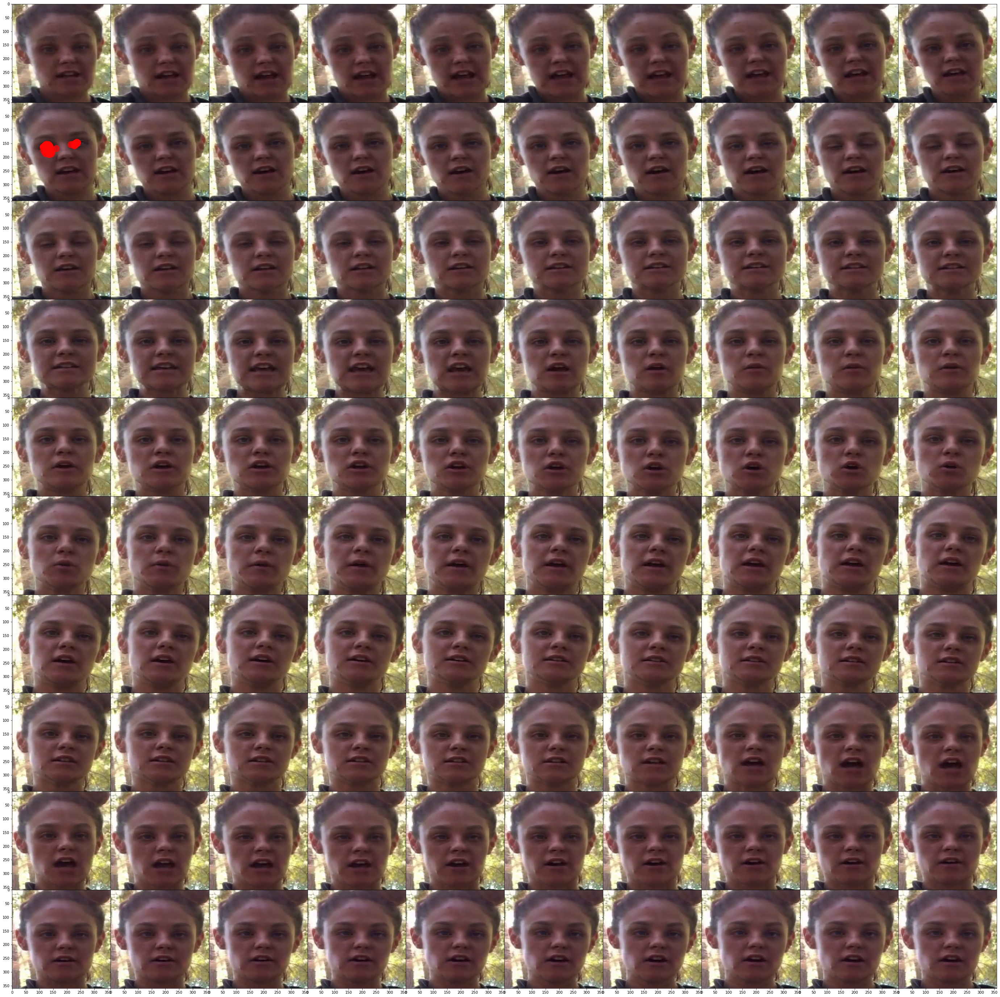

Looking at vid 0-1
URL: http://visiongpu23.csail.mit.edu/scratch/datasets/DeepfakeDetection/facenet_smooth_frames/dfdc_train_part_6/fmwgxwsydg.mp4/face_0.mp4
/home/camilo/Datasets/facenet_smooth_frames/dfdc_train_part_6/fmwgxwsydg.mp4/face_0.mp4
Frames per second 30.0
Number of frames 240.0
Duration of the video 8.0


KeyboardInterrupt: 

<Figure size 3600x3600 with 0 Axes>

In [42]:

FPS = 30    
UI_VIDEO_FACTOR = 540

def visualize_mturk_responses(resp_list, overlay_on_first_frame=True):
    '''Overlay the mturk responses to their correponding videos. 
    Can overlay on either the first frame of the video or the frame where the annots belong'''
    
    for resp in resp_list:
        d = resp["results"]
        for vid_n, vid_d in d["outputs"].items():
            print("Looking at vid", vid_n)
            vid_url = list(vid_d.keys())[0]
            print("URL:", vid_url)
            annot_list = vid_d[vid_url]
            
            vid = load_video(vid_url, plot=False)
            show_overlay(vid, annot_list, overlay_on_first_frame)      

            


def load_video(url, plot=True, data_path = '/home/camilo/Datasets/'):
    '''Loads video from scratch if scratch is mounted. Else, downloads the video.'''
    
    vid_name = url.split('DeepfakeDetection/')[-1]
    
    if os.path.isdir(data_path):

        cap = cv2.VideoCapture(os.path.join(data_path, vid_name))
        print(os.path.join(data_path, vid_name))
        print("Frames per second", cap.get(cv2.CAP_PROP_FPS))
        print("Number of frames", cap.get(cv2.CAP_PROP_FRAME_COUNT))
        print("Duration of the video", cap.get(cv2.CAP_PROP_FRAME_COUNT)/cap.get(cv2.CAP_PROP_FPS))
        
        flag = True
        frames = []
        
        while flag:
            flag, fr = cap.read()
            
            if flag: frames.append(np.expand_dims(fr[:,:,::-1],0))
#             print(frames[-1].shape)
            
    if plot:
        plt.imshow(frames[0][0])
        plt.show()
    return np.concatenate(frames, axis=0)
    
    
def show_overlay(vid, annot_list, overlay_on_first_frame=True, show_in_one_image=False):
    '''Displays human annotations on deepfake images. 
    Can display either all annotations in one frame, or annotations in their respective frames
    as a mosaic.'''

    
    if show_in_one_image:
        # Calculate frame where most annots happened
        c = Counter([a[2] for a in annot_list])
        sec_mode, n_annots_at_that_sec = c.most_common(1)[0]
        idx_mode = int(np.round(sec_mode*FPS))
        print("Max number of annotations (%d) ocurred at second %.3f (frame %d)" % (n_annots_at_that_sec, sec_mode, idx_mode))
        
        image = vid[idx_mode]
        
        resc_factor_x = image.shape[1]/UI_VIDEO_FACTOR
        resc_factor_y = image.shape[0]/UI_VIDEO_FACTOR
        
        # Show image
        fig,ax = plt.subplots(1)
        ax.set_aspect('equal')
        ax.imshow(vid[idx_mode])
        
        # Overlay annotations
        overlay_on_one_image(ax, annot_list, resc_factor_x, resc_factor_y)
        
    else: # show as mosaic
        # Create mosaic
        fig = plt.figure(figsize=(50, 50))
        grid = ImageGrid(fig, 111,  # similar to subplot(111)
                         nrows_ncols=(10, 10),  # creates 10x10 grid of axes
                         axes_pad=0,  # pad between axes in inch.
                         )
        # Separate annots into corresponding frames
        ann_dict={i:[] for i in range(len(vid))}
        for a in annot_list:
            idx = int(np.round(a[2]*FPS))
            ann_dict[idx].append(a)
            
        # Overlay annots on each image
        c=0
        for ax, im in zip(grid, vid):
            ax.imshow(im)
            resc_factor_x = im.shape[1]/UI_VIDEO_FACTOR
            resc_factor_y = im.shape[0]/UI_VIDEO_FACTOR
        
            overlay_on_one_image(ax, ann_dict[c], resc_factor_x, resc_factor_y)
            c+=1
        plt.show()
            

def overlay_on_one_image(ax, annot_list, resc_factor_x=1, resc_factor_y=1):
    if not annot_list: return
    
    for x,y,f,s in annot_list:
            circ = Circle((x*resc_factor_x,y*resc_factor_y),s,color=(1,f/15,f/15,0.7))
            ax.add_patch(circ)
#     plt.show()

    
visualize_mturk_responses(resp_list, overlay_on_first_frame=True)

## Create Heat volumes

/home/camilo/Datasets/facenet_smooth_frames/dfdc_train_part_0/itwvssoevj.mp4/face_0.mp4
Frames per second 30.0
Number of frames 299.0
Duration of the video 9.966666666666667


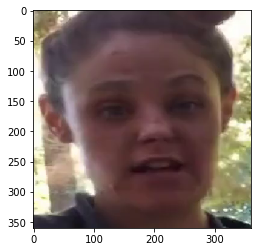

len(annots) 23
ANNOTATION  0
heatvol.shape (299, 360, 360)
min, max, mean of heatvol before conv 0.0 1.0 1.3677278170031794e-06
min, max, mean of heatvol after conv 0.0 1.0 0.0015026682998328812


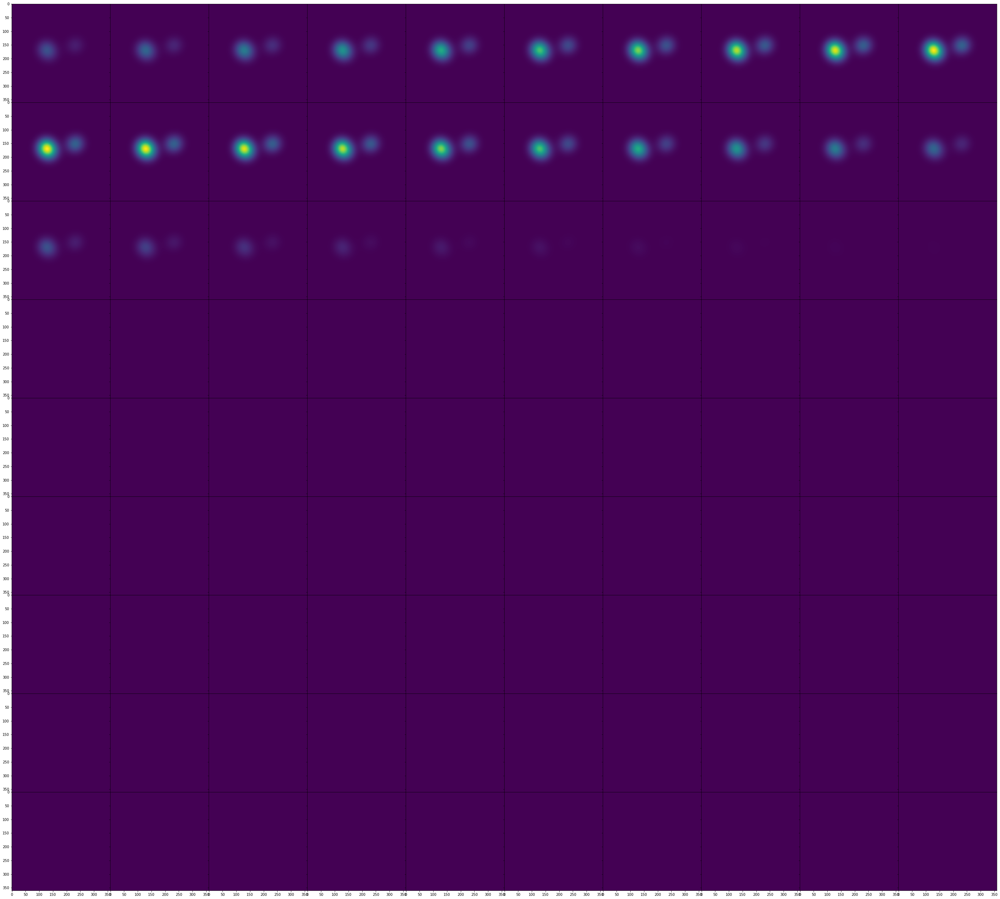

Saving as torch tensor


In [94]:
# Create average heatvolumes
import scipy
from scipy.ndimage import gaussian_filter

def make_one_heatvol(vid, annot_list, resc_factor_x, resc_factor_y, keep_annot_size=False):
    
    heatvol = np.zeros_like(vid[...,0], dtype=np.float)
    print("heatvol.shape", heatvol.shape)
    for x,y,f,s in annot_list:
        idx = int(np.round(f*FPS))
#         print("x,y,f,s,idx",x,y,f,s,idx)
        heatvol[idx,int(np.round(y*resc_factor_y)),int(np.round(x*resc_factor_x))]=1.0
#         if keep_annot_shape:

#     plt.imshow(heatvol[idx])
#     plt.show()
            
    return heatvol

def convolve_3d(heatvol, kernel_size = [6,20,20]):
    heatvol = gaussian_filter(heatvol, sigma = kernel_size, mode='constant')
    return heatvol
        
def view(heatvol):
    
    vmin = np.min(heatvol)
    vmax = np.max(heatvol)
    
    # Create mosaic
    fig = plt.figure(figsize=(50, 50))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(9, 10),  # creates 10x10 grid of axes
                     axes_pad=0,  # pad between axes in inch.
                     )
    
    # View each frame of the annot
    for i,ax in enumerate(grid):
        ax.imshow(heatvol[i], vmin=vmin, vmax=vmax)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
def make_avg_heatvol(vid_url, annots, convolve=True, 
                     view_single=True, view_full=True, out_path='../../heatvols',
                     save=True):
    
    vid = load_video(vid_url, plot=True)
    
    resc_factor_x = vid.shape[2]/UI_VIDEO_FACTOR
    resc_factor_y = vid.shape[1]/UI_VIDEO_FACTOR
    
    heatvols = []
    
    print("len(annots)",len(annots))
    for c, ann in enumerate(annots):
        print("ANNOTATION ",c)
        heatvol = make_one_heatvol(vid, ann, resc_factor_x, resc_factor_y)
            
        print("min, max, mean of heatvol before conv", np.min(heatvol), np.max(heatvol), np.mean(heatvol))
        if convolve:
            heatvol = convolve_3d(heatvol)
        heatvol = (heatvol-heatvol.min())/(heatvol.max()-heatvol.min())

        print("min, max, mean of heatvol after conv", np.min(heatvol), np.max(heatvol), np.mean(heatvol))
            
#         if view_single and c<5:
#             view(heatvol)
        
        heatvols.append(heatvol)
        break
        
    avg_heatvol = np.mean(heatvols, axis=0)
    
    if view_full:
        view(avg_heatvol)
        
    if save:
        os.makedirs(out_path, exist_ok=True)
        save_as_torch_tensor(avg_heatvol, os.path.join(out_path, vid_url.split('/')[-2][:-4]+'.pt'))
#         save_as_video(avg_heatvol, os.path.join(out_path, vid_url))
    
    
def save_as_torch_tensor(arr, out_file):
    print("Saving as torch tensor")
    tensor = torch.Tensor(arr)
    torch.save(tensor, out_file) 
    
def save_as_video(arr, out_file):
    os.system("ffmpeg -r 30 -i ../datafile_pilot/exp2_res/frame_%01d.jpeg -vcodec mpeg4 -y ../datafile_pilot/exp2_res/movie.mp4")

def vidwrite(fn, images, framerate=60, vcodec='libx264'):
    if not isinstance(images, np.ndarray):
        images = np.asarray(images)
    n,height,width,channels = images.shape
    process = (
        ffmpeg
            .input('pipe:', format='rawvideo', pix_fmt='rgb24', s='{}x{}'.format(width, height))
            .output(fn, pix_fmt='yuv420p', vcodec=vcodec, r=framerate)
            .overwrite_output()
            .run_async(pipe_stdin=True)
    )
    for frame in images:
        process.stdin.write(
            frame
                .astype(np.uint8)
                .tobytes()
        )
    process.stdin.close()
    process.wait()
    
for vid_url, annots in vid2ann.items():
    make_avg_heatvol(vid_url, annots)
    break
    
    

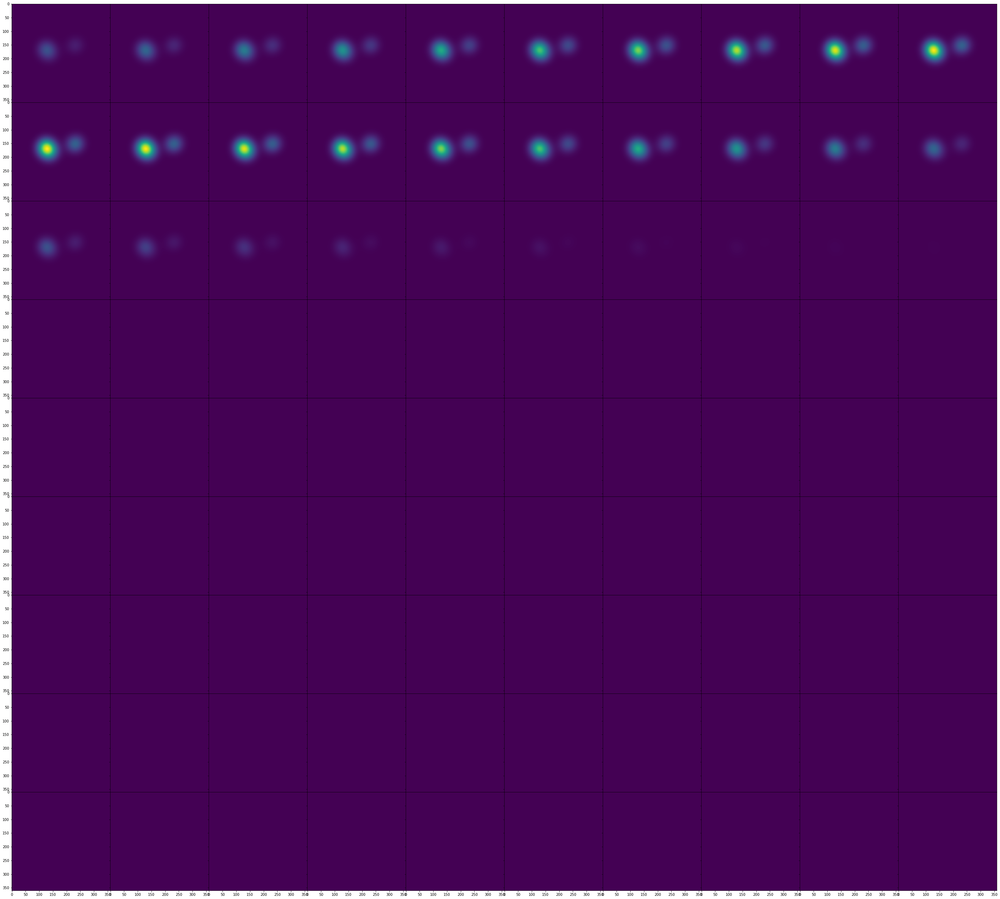

In [96]:
# test loading torch tensor

tens = torch.load('../../heatvols/itwvssoevj.mp4')

view(tens.data.numpy())